# <center>Advances in LibCEED with Applications to Fluid and Solid Mechanics</center>

<br>
<br>
<br>

### <center>Leila Ghaffari<sup>1</sup>, 
<br>
<center>Jeremy Thompson<sup>1</sup>, Valeria Barra<sup>1,2</sup>, and Jed Brown<sup>1</sup></center>  

<br>
  
<center><sub><sup><sup>1</sup> Department of Computer Science, CU Boulder</sup></sub></center>  
<center><sub><sup><sup>2</sup> Department of Environmental Science and Engineering, California Institute of Technology</sup></sub></center>

<br>
<br>
<br>

<center>SIAM CSE21, 2 March 2021</center>

<img align="left" src="ecp.png" width="500"/>  <img align="right" src="ceed-exascale-landscape.png" width="600"/>

# [libCEED](https://libceed.readthedocs.io): the CEED Library   <img align="right" src="libceed-qr-code.png" width="200"/>

<br>
<br>

<img src="badges.png" width="3000">

* High-order finite/spectral element (FEM/SEM) library exploiting tensor-product structure

* Open source (BSD-2 license) C library with Fortran, Python, Julia, and Rust interfaces

* [libCEED User Manual](https://libceed.readthedocs.io/en/latest/)

<img align="right" src="release.png" width="500"/>


# What does libCEED exactly do?

<br>
<br>

* Purely algebraic FEM library

* Backend plugins with run-time selection

* Single source vanilla C for QFunctions

* Same source code can call multiple CEEDs with different backends

* Available via MFEM, PETSc, Nek5000




<img align="right" src="libCEEDBackends.png" width="2000"/>


<center><sub><sup>Thanks to our backend developers Yohann Dudouit, Natalie Beams, Ahmad Abdelfattah, and David Medina.</sup></sub></center>

# Performance on CPU

In [7]:


from ceed_postprocess_base import read_logs
import altair as alt
from glob import glob

runs = read_logs(glob('petsc_bps_20200701.txt'))
runs['FE_nodes_per_compute_node'] = runs['num_unknowns'] / (runs['num_procs'] / runs['num_procs_node']) / runs['dof_per_node']
highlight = alt.selection_single(
    on='mouseover',
    fields=['degree', 'time_per_it', 'backend'],
    nearest=True,
    empty='none',
)

bps_select = alt.selection_single(
    fields=['bp'],
)

base = alt.Chart(runs).encode(
    alt.Y('mdofs:Q', title='MDoF/s per CG iteration'),
    alt.Color('degree:N'),
    alt.Size('num_unknowns', scale=alt.Scale(type='log', domain=(1e3, 1e6))),
    alt.Shape('bp:N'),
    tooltip=('bp', 'num_procs', 'backend', 'num_elem', 'degree', 'num_unknowns', 'file'),
).transform_filter(
    bps_select,
).transform_calculate(
    mdofs='datum.cg_iteration_dps/1e6',
)

points = base.mark_point().encode(
    opacity=alt.condition(highlight, alt.value(1), alt.value(.5)),
).add_selection(
    highlight,
)

lines = base.mark_line().encode(
    size=alt.condition(alt.datum.degree - highlight.degree == 0, alt.value(2), alt.value(1))
)

pane = points + lines

composite = (
    pane.encode(
        alt.X('time_per_it', scale=alt.Scale(type='log')),
    ) |
    pane.encode(
        alt.X('FE_nodes_per_compute_node', scale=alt.Scale(type='log', domain=(3e4, 1e7), clamp=True)),
    )
)

activator = alt.Chart(runs).mark_point().encode(
    alt.Y('bp', title='BP'),
    alt.Shape('bp')
).add_selection(bps_select).properties(title='Selection')

activator | composite.properties(title='Noether (2x EPYC 7452), gcc-10')



alt.HConcatChart(...)

# Performance on GPU

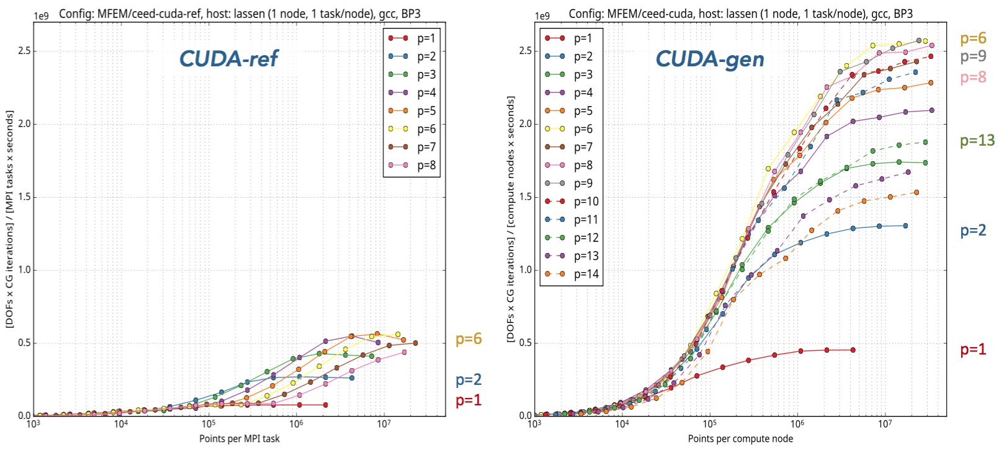

<center><img align="center" src="libCEEDDecomposition.png" width="1500"/></center>

\begin{gather*}
    v^T F(u) \sim \int_\Omega v \cdot \color{olive}{f_0(u, \nabla u)} + \nabla v \!:\! \color{olive}{f_1(u, \nabla u)} \quad 
    u = B_I \mathcal E_e u_L \qquad \nabla u = \frac{\partial X}{\partial x} B_{\nabla} \mathcal E_e u_L \\
    J w = \sum_e \mathcal E_e^T \begin{bmatrix} B_I \\ B_{\nabla} \end{bmatrix}^T
    \underbrace{\begin{bmatrix} I & \\ & \left( \frac{\partial X}{\partial x}\right)^T \end{bmatrix} W_q \color{teal}{\begin{bmatrix} f_{0,0} & f_{0,1} \\ f_{1,0} & f_{1,1} \end{bmatrix}} \begin{bmatrix} I & \\ & \left( \frac{\partial X}{\partial x}\right) \end{bmatrix}}_{\text{coefficients at quadrature points}} \begin{bmatrix} B_I \\ B_{\nabla} \end{bmatrix} \mathcal E_e w_L
\end{gather*}

# Toward Creating a CEED Operator

#### <center>Mass Operator $\int_\Omega v \cdot u$</center>


# $D$ - QFunction  <img align="right" src="header_D.png" width="1000"/>

* The weak form of the physics of the problem at quadrature points.

* Single QFunction for all Bakends.

* Point-wise; does not depend on element resolution, topology, or basis order.

```c
int mass(void *ctx, const CeedInt Q, const CeedScalar *const *in, CeedScalar *const *out) {
  const CeedScalar *rho = in[0], *u = in[1];
  CeedScalar *v = out[0];
  for (CeedInt i=0; i<Q; i++) {
    v[i] = rho[i] * u[i];
  }
  return 0;
}



```c
CeedQFunctionCreateInterior(ceed, 1, mass, mass_loc, &qf_mass);
```
-----
```c
CeedQFunctionAddInput(qf_mass, "rho", 1, CEED_EVAL_NONE);
CeedQFunctionAddInput(qf_mass, "u", 1, CEED_EVAL_INTERP);
CeedQFunctionAddOutput(qf_mass, "v", 1, CEED_EVAL_INTERP);
```

$B$ - Basis <img align="right" src="header_B.png" width="1000"/>

* Describes the actions on basis such as interpolation, gradient, div, curl

* Independent of geometry and element topology

* Provided by the user




<img align="center" src="B_applicator.png" width="500"/>

#### We provide helper functions
* $H^1$ Lagrange basis:
```c
CeedBasisCreateTensorH1Lagrange(ceed, 1, 1, P, Q, CEED_GAUSS, &bu);
```
* $H^1$ Simplex non-tensor basis:
```c
CeedBasisCreateH1(ceed, CEED_TRIANGLE, 1, P, Q, interp, grad, qref, qweight, &bu);
```

$\mathcal E$ - ElemRestriction <img align="right" src="header_E.png" width="1000"/>

* Restrict to single element
* User choice in ordering

```c
CeedElemRestrictionCreate(ceed, nelem, P, 1, 1, Nu, CEED_MEM_HOST,
                          CEED_USE_POINTER, indu, &Erestrictu);
CeedInt stridesu[3] = {1, Q, Q};
CeedElemRestrictionCreateStrided(ceed, nelem, Q, 1, Q*nelem, stridesu, &Erestrictui);
```

$A_{local}$ - Operator <img align="right" src="header_ceed.png" width="1000"/>

* `Operator` $A_{\text{local}} = \mathcal E^T B^T D B \mathcal E$
  * `ElemRestriction` $\mathcal E$
  * `Basis` $B$
  * `QFunction` $D$

```c
CeedOperatorCreate(ceed, qf_mass, CEED_QFUNCTION_NONE, CEED_QFUNCTION_NONE, &op_mass);
```
-----------
```c
CeedOperatorSetField(op_mass, "rho", Erestrictui, CEED_BASIS_COLLOCATED, qdata);
CeedOperatorSetField(op_mass, "u", Erestrictu, bu, U);
CeedOperatorSetField(op_mass, "v", Erestrictu, bu, V);
```
-------
```c
CeedOperatorApply(op_mass, CEED_VECTOR_NONE, CEED_VECTOR_NONE, CEED_REQUEST_IMMEDIATE);
```

# Composite Operator

* Sums multiple operators

* Different polynomial degree, element topology, physical process

* Applied for Neumann BCs

<img align="center" src="point_wise.png" width="500"/>

```c
CeedCompositeOperatorCreate(ceed, &op_mass);
```
----
```c
CeedCompositeOperatorAddSub(op_mass, op_massTet);
CeedCompositeOperatorAddSub(op_mass, op_massHex);
```

# [Solid mechanics miniapp](https://libceed.readthedocs.io/en/latest/examples/solids/#solid-mechanics-mini-app)

#### Three modes
* Linear elasticity
* Neo-Hookean hyperelasticity at small strain
* Neo-Hookean hyperelasticity at finite strain

$- \nabla_X \cdot \boldsymbol{P} - \rho_0 \boldsymbol{g} = \boldsymbol{0}$

----
$\boldsymbol{P} = \boldsymbol{F} \, \boldsymbol{S}$

$\boldsymbol S$ &rightarrow;  *second Piola-Kirchhoff stress* tensor 

$\boldsymbol{F}$ = $\boldsymbol I_3 + \nabla_X \boldsymbol u$ &rightarrow; *deformation gradient*


#### Traction

----


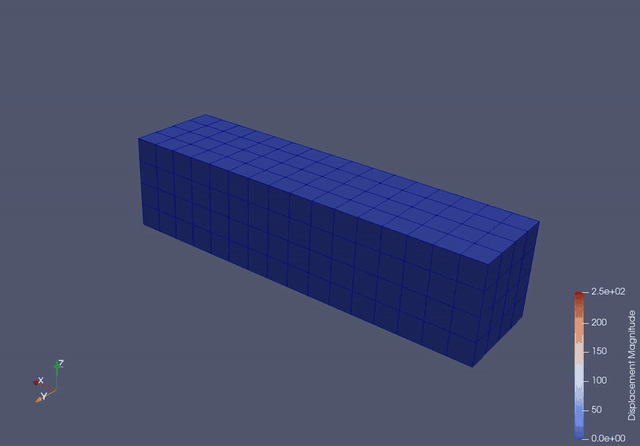

#### Twisting

----


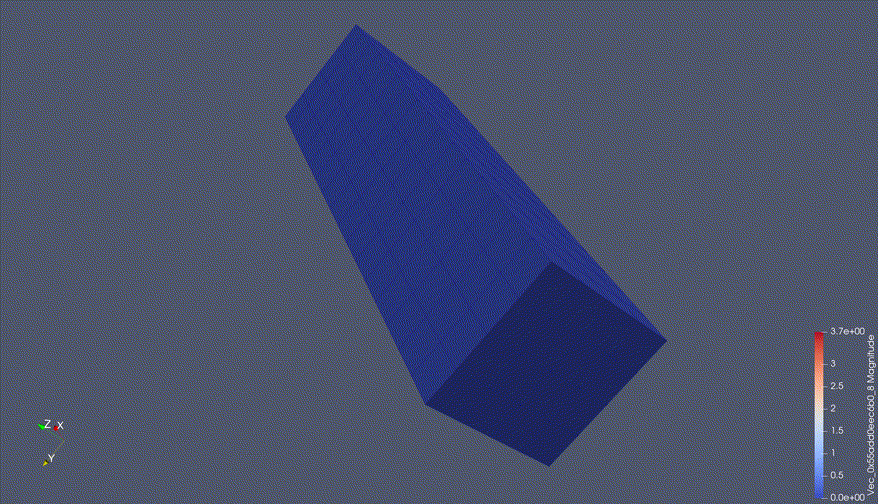

# Grid transfer operators

* `General libCEED Operator`  \
$A_{\text{local}} = \mathcal E^T B^T D B \mathcal E$

* `Interpolation Operator`  \
$A_{\text{coarse-to-fine}}$ = $\mathcal E_{\text{coarse}}^T I \frac{1}{m} B_{\text{coarse-to-fine}} \mathcal E_{\text{fine}}$

* `Interpolation Basis`

    * $B_{\text{coarse-to-fine}}$ = $R^{-1} Q^T B_{\text{coarse}}$
    * $B_{\text{coarse}} = Q R$

### <center>$p$-multigrid</center>
<center>3 level multigrid with PETSc PCMG</center>
<center><img align="center" src="multigrid.png" width="700"/></center>
<center>Coarse Solve - AMG on finer elements</center>
<center>Smoother - Chebyshev based on a Jacobi with true operator diagonal</center>

#### $p$-multigrid
```c
CeedOperatorMultigridLevelCreate(CeedOperator opFine, CeedVector PMultFine, CeedElemRestriction rstrCoarse,
CeedBasis basisCoarse, CeedOperator *opCoarse, CeedOperator *opProlong, CeedOperator *opRestrict);
```
#### Operator Diagonal
```c
CeedOperatorLinearAssembleDiagonal(CeedOperator op, CeedVector assembled, CeedRequest *request);
```
#### Point Block Diagonal
```c
CeedOperatorLinearAssemblePointBlockDiagonal(CeedOperator op, CeedVector assembled, CeedRequest *request);
```

# [Compressible Navier-Stokes miniapp](https://libceed.readthedocs.io/en/latest/examples/fluids/#compressible-navier-stokes-mini-app)

#### Three versions

---
* Advection (2D & 3D)
   * Rotation
   * Translation
* Isentropic Vortex (Euler)
* Density Current (Navier-Stokes)

#### <center>Compressible Navier-Stokes equations in conservative form</center>

----
\begin{aligned}
   \frac{\partial \rho}{\partial t} + \nabla \cdot \boldsymbol{U} &= 0 \\
   \frac{\partial \boldsymbol{U}}{\partial t} + \nabla \cdot \left( \frac{\boldsymbol{U} \otimes \boldsymbol{U}}{\rho} + P \boldsymbol{I}_3 -\boldsymbol\sigma \right) + \rho g \boldsymbol{\hat k} &= 0 \\
   \frac{\partial E}{\partial t} + \nabla \cdot \left( \frac{(E + P)\boldsymbol{U}}{\rho} -\boldsymbol{u} \cdot \boldsymbol{\sigma} - k \nabla T \right) &= 0 \, , \\
\end{aligned}

-----

<center>$\boldsymbol{\sigma} = \mu(\nabla \boldsymbol{u} + (\nabla \boldsymbol{u})^T + \lambda (\nabla \cdot \boldsymbol{u})\mathbf{I}_3)$</center>


<center>$P = \left( {c_p}/{c_v} -1\right) \left( E - {\boldsymbol{U}\cdot\boldsymbol{U}}/{(2 \rho)} - \rho g z \right)$</center>

#### Density Current
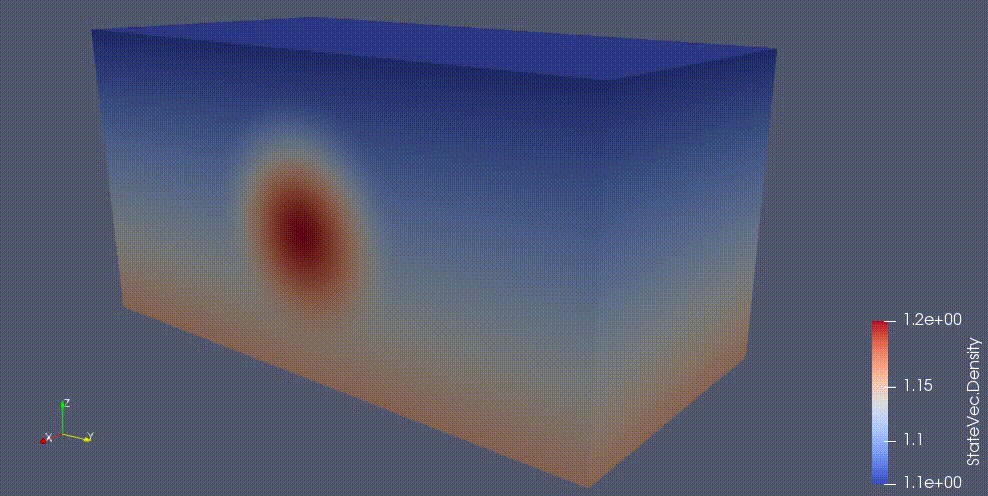


#### <center>Vector form</center>

----
\begin{aligned}
\frac{\partial \boldsymbol{q}}{\partial t} + \nabla \cdot \boldsymbol{F}(\boldsymbol{q}) -S(\boldsymbol{q}) = 0 \,
\end{aligned}

#### Stabilization Techniques
* SU (streamline-upwind)
* SUPG (streamline-upwind/Petrov-Galerkin) &rightarrow; **implicit time-stepping**

## Isentropic Vortex (Euler)

<center>mean flow:</center>
<center>$\rho=1$, $P=1$, $T=P/\rho= 1$, and $\boldsymbol{u}=(u_1,u_2,0)$</center>

\begin{aligned}
   (\delta u_1, \, \delta u_2) &= \frac{\epsilon}{2 \pi} \, e^{0.5(1-r^2)} \, (-\bar{y}, \, \bar{x}) \,  \\
   \delta T &= - \frac{(\gamma-1) \, \epsilon^2}{8 \, \gamma \, \pi^2} \, e^{1-r^2} \,  \\
   \delta S &= 0 \, , S = P/\rho^\gamma   \,
\end{aligned}

<center>BCs: $\int_{\partial \Omega_{inflow}} \boldsymbol v \cdot \boldsymbol{F}(\boldsymbol q_N) \cdot \widehat{\boldsymbol{n}} \,dS $ , $\int_{\partial \Omega_{outflow}} \boldsymbol v \cdot \boldsymbol{F}(\boldsymbol q_N) \cdot \widehat{\boldsymbol{n}} \,dS$</center>

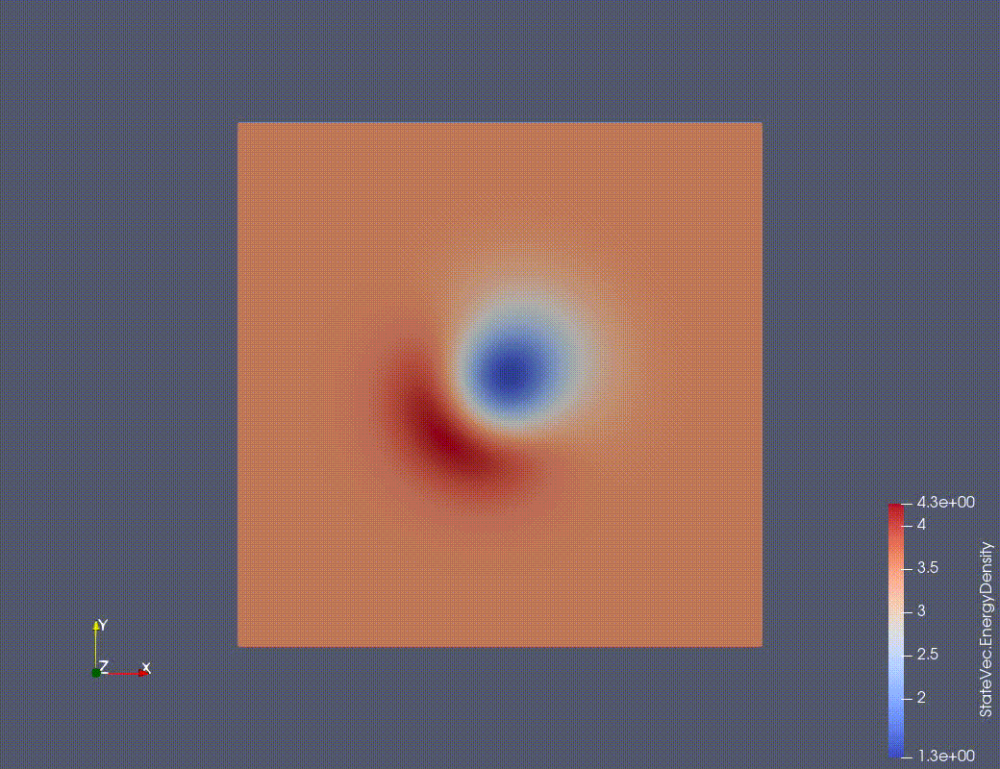

<img src="etv_convergence_study.png" width=800>
<img align="left" src="s_.png" width=800> 

# Outlook

  * Backend optimization
  * Algorithmic differentiation (AD)
  * Higher level interfaces (MFEM, PETSc)
  * Examples
  * We invite contributors and friendly users

<sub><sup>Acknowledgements: Exascale Computing Project (17-SC-20-SC)</sup></sub>

<img align="left" src="ceed-exascale-landscape.png" width="700"/>

<img align="left" src="ecp.png" width="700"/>


<img src="julia.png" width="1500">

[Julia Interface](http://ceed.exascaleproject.org/libCEED-julia-docs/dev/)